# Digital Image Processing HW3
## Student Name: Amirmehdi Jafari Fesharaki
## Student ID: 98109645
---
## Theoretical Questions
### Question 1

Due to the fact that the gaussian filter is sepearatable, we can first prove for one dimensional case and then generalize it for the two dimensional case.

For the one dimensional gaussian filter we have:
$$
\begin{align}
    f(x) &= \frac{1}{\sqrt{2\pi}\sigma}  e^{-\frac{x^2}{2\sigma^2}}\\
	\implies F(u) &= \int \frac{1}{\sqrt{2\pi}\sigma} e^{-\frac{x^2}{2\sigma^2}} e^{-j2\pi ux} dx \\
	\frac{dF(u)}{du} &= -\frac{j\sqrt{2\pi}}{\sigma} \int e^{-j2\pi ux}xe^{-\frac{x^2}{2\sigma^2}}dx  \notag\\
	&=  \frac{j\sqrt{2\pi}}{\sigma} \int e^{-j2\pi ux} d(\sigma^2 e^{-\frac{x^2}{2\sigma^2}}) \notag \\
	&= j\sqrt{2\pi} \sigma \left[ e^{-j2\pi ux -\frac{x^2}{2\sigma^2}}\Big|_{-\infty}^{\infty}  + j 2\pi u \int e^{-\frac{x^2}{2\sigma^2}} e^{-j2\pi ux} dx \right] \notag \\
	&= - 4 \pi^2 \sigma u F(u) \notag \\
	\implies \frac{dF(u)}{F(u)} &= - 2\pi^2\sigma^2 d(u^2) \implies \ln(\frac{F(u)}{F(0)}) = - 2\pi^2 \sigma^2 u^2 \notag \\
	\implies F(u) &= F(0) e^{-2\pi^2\sigma^2u^2}  \notag \\
	F(0) &= \int \frac{1}{\sqrt{2\pi}\sigma} e^{-\frac{x^2}{2\sigma^2}} dx = \sqrt{2\pi} \sigma \notag \\
	\overset{}{\implies} F(u) &= \sqrt{2\pi} \sigma e^{-2\pi^2\sigma^2u^2}
\end{align}
$$

Now using the equation above, we can simply do the same thing for a two dimensional gaussian filter and then separate the integrals. If we do so, we would find out that the fourier transform of a two dimensional gaussian filter is as given below:
$$
\begin{align}
f(x,y) &= \frac{1}{2\pi\sigma^2} e^{-\frac{x^2 + y^2}{2\sigma^2}} \\
\implies F(u,v) &= 2\pi\sigma^2 e^{-2\pi^2\sigma^2(u^2 + v^2)}
\end{align}
$$

As a result of the obtained equation, as u or v increases, the value of the fourier transform decreases, which means that the gaussian filter is a **lowpass filter**.

---

### Question 2
**a)** When we first apply a lowpass and then a highpass filter, the resultant of the two filters would be a probably be a bandpass filter or something like it. This bandpass filter has an optimum on some frequencies and in the case of our image, the reason the ring is the brightest element of the image, when we expect it to be dark because the DC components should be zero, is that the ring has a lenght equivalent to the frequencies around the optimal frequency. This results in the amplification of the ring on one hand, and the attenuation of the other parts (containing the edge of the bones because they have a much higher frequency) on the other hand. Here, is an illustration for the resultant of a lowpass and a highpass filter in 1D case which could be generalized to our 2D case as well.


In [1]:
import numpy as np
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt
from scipy import ndimage
from scipy import signal
from time import process_time

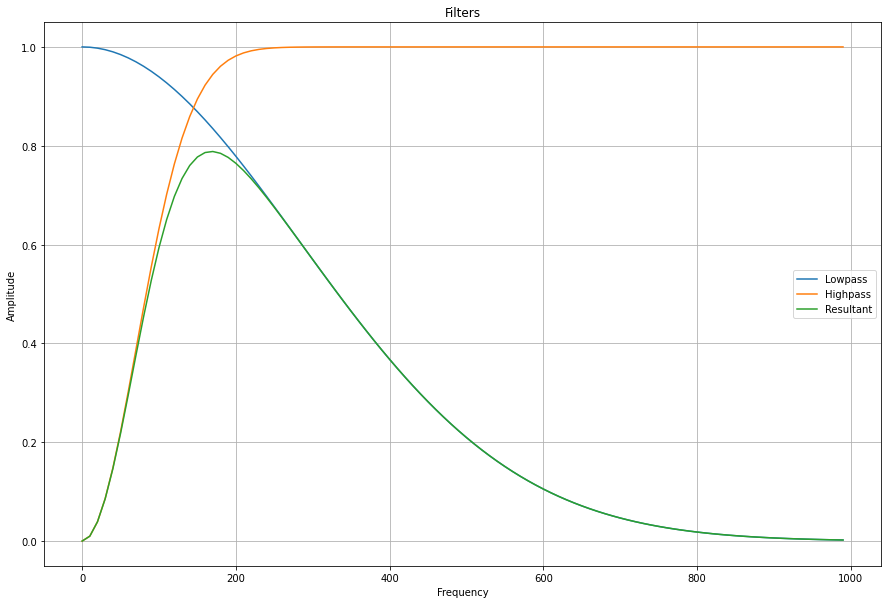

In [2]:
N = 100
f = np.linspace(0,1e3-10, N)
sigma1 = 400
lowpass = np.exp(-f**2/sigma1**2)

sigma2 = 100
highpass = 1 - np.exp(-f**2/sigma2**2)

resultant = lowpass * highpass

plt.figure(figsize=(15,10))
plt.plot(f, lowpass)
plt.plot(f, highpass)
plt.plot(f, resultant)
plt.grid()
plt.title("Filters")
plt.legend(["Lowpass", "Highpass", "Resultant"])
plt.xlabel("Frequency")
plt.ylabel("Amplitude")
plt.show()

**b)** In the ideal case where there is no quantization, the results would be just the same. However, when we have quantization, there would probably be some minor differences but the overall results will be same. 

### Question 3
For a one dimensional signal, we Define $X[k]$ the k-th index of the N point DFT of a signal $x[n]$. Now, we now that:

If $x_2[n] = x_1[((-n))_N], N$, then the DFT of these signals would have the relation, $X_2[k] = X_1[((-k))_N], N$.
It also worths mentioning that $x[((-n))_N]$ is the circular symmetry of the signal $x[n]$ which means:
$$
x[((-n))_N] = \begin{cases}
x[N-n], &n\ne0 \\
x[0], &n = 0
\end{cases}
$$

where $N$ is the length of the signal.
However, in order to completely flip the signal, we should then apply a 1 point circular shift to the signal $x_2[n]$, which means that $x_3[n] = x_2[((n+1))_N], N$. Then the relation between DFTs would be $X_3[k] = e^{\frac{j2\pi k}{N} } X_2[k]$ which leads to $X_3[k] = e^{\frac{j2\pi k}{N}} X_1[((-k))_N]$.
<br><br>
Finally, for the 2 dimensional case, if we define $x_3[n,m]$ as the flipped version of the signal $x_1[n,m]$, then the relation between their DFTs should be as given below:
$$ 
X_3[u,v] = e^{\frac{j2\pi u}{N} + \frac{j2\pi v}{M}} X_1[((-u))_N, ((-v))_M]
$$

Here is also an example of flipping a 2d-array using is DFT:

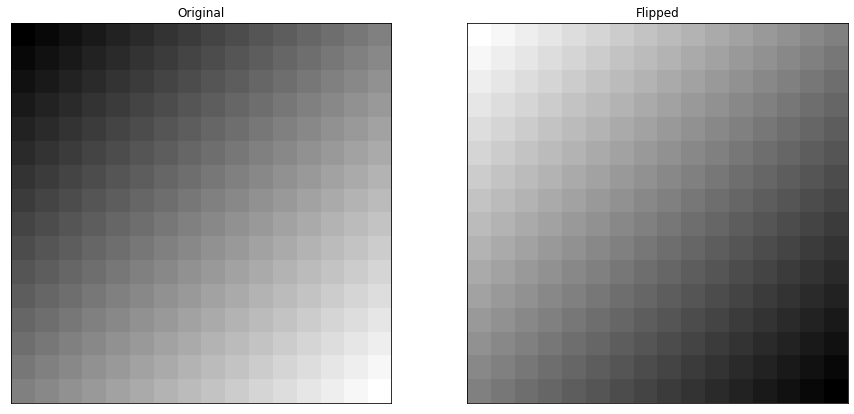

In [3]:
x = np.zeros((16,16))
for i in range(16):
    for j in range(16):
        x[i,j] = i+j
x = x.astype("uint8")
N = x.shape[0]
M = x.shape[1]

# calculating the circular reversal of the fft
x_fft = np.fft.fft2(x)
x_fft_flipped = np.roll(np.flip(x_fft, axis=0), 1, axis=0)
x_fft_flipped = np.roll(np.flip(x_fft_flipped, axis=1), 1, axis=1)

# defining the array of e^{j2piu/N + j2piv/M}
W = np.empty((N,M), dtype='complex128')
for u in range(N):
    for v in range(M):
        W[u,v] = np.exp(2j * np.pi * u / N + 2j * np.pi * v/M)

x_fft_final = W * x_fft_flipped
x_flipped = np.round_(np.real(np.fft.ifft2(x_fft_final))).astype("uint8")


# plotting both original and flipped image
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.imshow(x, cmap="gray")
plt.xticks([]);
plt.yticks([]);
plt.title("Original")

plt.subplot(1,2,2)
plt.imshow(x_flipped, cmap="gray")
plt.xticks([]);
plt.yticks([]);
plt.title("Flipped")

plt.show()

---

## Practical Questions
### Question 1

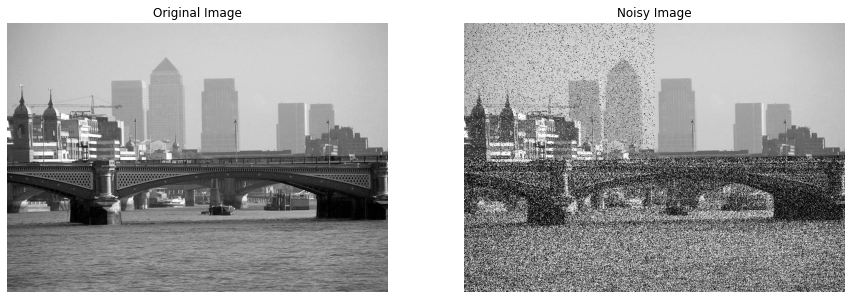

In [4]:
im_orig = np.array(Image.open("./city_orig.jpg")).astype("double")
im_noise = np.array(Image.open("./city_noise.jpg")).astype("double")

def imshow(im, title, cmap = "gray"):
    plt.imshow(im, cmap=cmap)
    plt.xticks([])
    plt.yticks([])
    plt.title(title)
    plt.box(False)

plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
imshow(im_orig, "Original Image")
plt.subplot(1,2,2)
imshow(im_noise, "Noisy Image")

In [5]:
N, M = im_orig.shape

# slicing original image
im_orig_11 = im_orig[0:N//2-1, 0:M//2+1].copy()
im_orig_12 = im_orig[0:N//2-1, M//2+1:M].copy()
im_orig_21 = im_orig[N//2-1:N, 0:M//2+1].copy()
im_orig_22 = im_orig[N//2-1:N, M//2+1:M].copy()
# slicing noisy image
im_noise_11 = im_noise[0:N//2-1, 0:M//2+1].copy()
im_noise_12 = im_noise[0:N//2-1, M//2+1:M].copy()
im_noise_21 = im_noise[N//2-1:N, 0:M//2+1].copy()
im_noise_22 = im_noise[N//2-1:N, M//2+1:M].copy()

def snr_calculator(x, y):
    num = np.sum(x**2)
    den = np.sum((x-y)**2)
    snr = 10 * np.log10(num/den)
    return snr

snr_11 = snr_calculator(im_orig_11, im_noise_11)
snr_12 = snr_calculator(im_orig_12, im_noise_12)
snr_21 = snr_calculator(im_orig_21, im_noise_21)
snr_22 = snr_calculator(im_orig_22, im_noise_22)

<ipython-input-5-adcc7739a69e>:17: RuntimeWarning: divide by zero encountered in double_scalars
  snr = 10 * np.log10(num/den)


The definition of 11,12,21,22 is as shown below:

| | |
|---|---|
|11|12|
| | |
|21|22|

In [6]:
print("SNR of 11 is: ", snr_11)
print("SNR of 12 is: ", snr_12)
print("SNR of 21 is: ", snr_21)
print("SNR of 22 is: ", snr_22)

SNR of 11 is:  12.017100563778493
SNR of 12 is:  inf
SNR of 21 is:  3.285812696635826
SNR of 22 is:  4.13827190823983


#### Applying Filters
#### *Median*

In [7]:
def median_filter(im, n=3):
    ''' Gets an input image "im" and a window size "n" which should be an odd number, then gives the output of a 
    median filter as the output.'''
    
    out = np.empty(im.shape)
    for i in range(im.shape[0]):
        for j in range(im.shape[1]):
            median = np.median((im[max(0, i - n//2):min(im.shape[0], i + n//2 + 1), 
                          max(0, j - n//2):min(im.shape[1], j + n//2 + 1)]).flatten())
            out[i,j] = median
    return out

In [8]:
im_median = median_filter(im_noise)

SNR of 11,12,21,22 respectively:
24.15177939714285
33.9861031631927
9.328435846553626
10.073668274833196


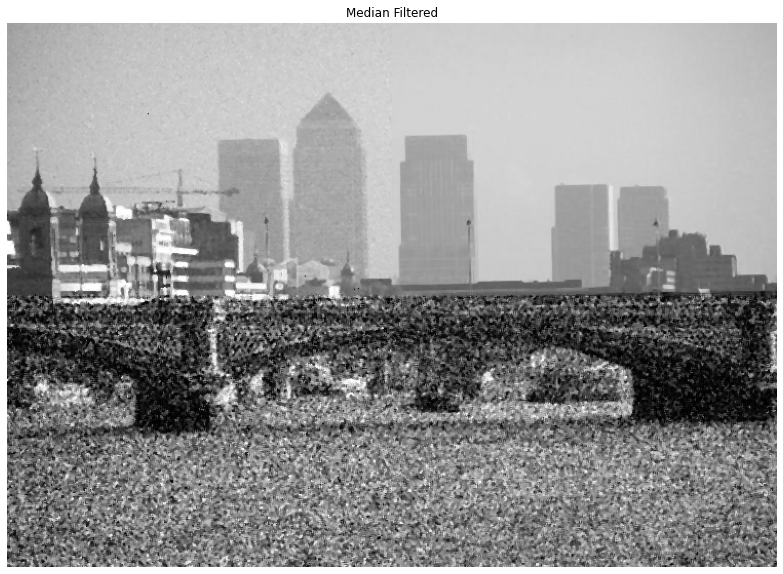

In [9]:
im_median = im_median.astype("uint8")
plt.figure(figsize=(15,10))
imshow(im_median, "Median Filtered")

im_median_11 = im_median[0:N//2-1, 0:M//2+1].copy()
im_median_12 = im_median[0:N//2-1, M//2+1:M].copy()
im_median_21 = im_median[N//2-1:N, 0:M//2+1].copy()
im_median_22 = im_median[N//2-1:N, M//2+1:M].copy()

snr_11_median = snr_calculator(im_orig_11, im_median_11)
snr_12_median = snr_calculator(im_orig_12, im_median_12)
snr_21_median = snr_calculator(im_orig_21, im_median_21)
snr_22_median = snr_calculator(im_orig_22, im_median_22)

print("SNR of 11,12,21,22 respectively:")
print(snr_11_median)
print(snr_12_median)
print(snr_21_median)
print(snr_22_median)

As can be seen, the median filter acts perfectly for the salt and pepper noise. However, for the other two parts of the image with only gaussian and the combination of gaussian and salt and pepper noise, it increases the SNR but it doesn't do any visual improvements.

#### *Gaussian*

In [10]:
def gaussian_kernel(n, m, sigma):
    x0 = n//2
    y0 = m//2
    kernel = np.zeros((n,m))
    for i in range(n):
        for j in range(m):
            kernel[i,j] = np.exp(-((i-x0)**2 + (j-y0)**2)/(2 * sigma**2))
    kernel = kernel / np.sum(kernel)
    return kernel

In [11]:
kernel = gaussian_kernel(7,7,1)
im_gaussian = ndimage.convolve(im_noise, kernel)
im_gaussian = np.round_(im_gaussian).astype("uint8")

SNR of 11,12,21,22 respectively:
20.281933856427614
33.46497309028054
11.689197312868206
12.680109670715204


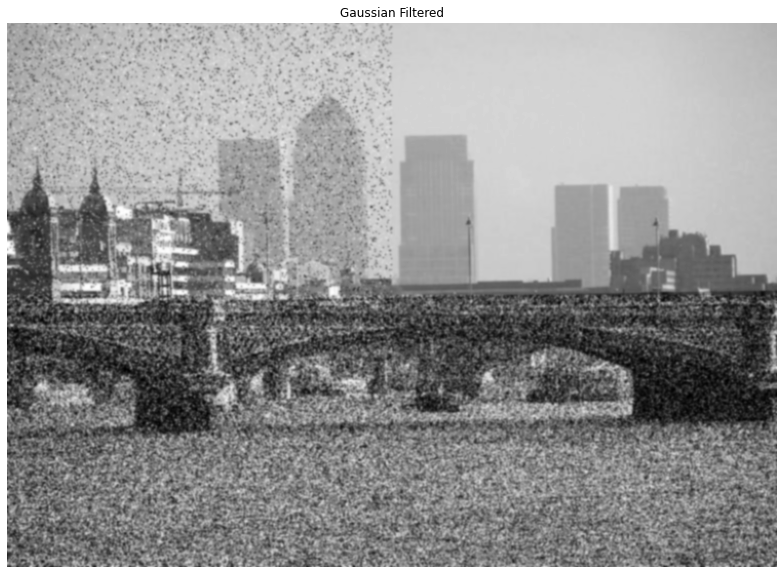

In [12]:
plt.figure(figsize=(15,10))
imshow(im_gaussian, "Gaussian Filtered")

im_gaussian_11 = im_gaussian[0:N//2-1, 0:M//2+1].copy()
im_gaussian_12 = im_gaussian[0:N//2-1, M//2+1:M].copy()
im_gaussian_21 = im_gaussian[N//2-1:N, 0:M//2+1].copy()
im_gaussian_22 = im_gaussian[N//2-1:N, M//2+1:M].copy()

snr_11_gaussian = snr_calculator(im_orig_11, im_gaussian_11)
snr_12_gaussian = snr_calculator(im_orig_12, im_gaussian_12)
snr_21_gaussian = snr_calculator(im_orig_21, im_gaussian_21)
snr_22_gaussian = snr_calculator(im_orig_22, im_gaussian_22)

print("SNR of 11,12,21,22 respectively:")
print(snr_11_gaussian)
print(snr_12_gaussian)
print(snr_21_gaussian)
print(snr_22_gaussian)

Due to the results above, the gaussian filter reduces the salt and pepper noise both visually and based on SNR. It does not act better than the median filter for this type of noise but it certainly works better for the two lower sides of the image considering both visual and SNR aspects.

#### *Mean*

In [13]:
mean_kernel = np.array([[1,1,1],[1,1,1],[1,1,1]])/9
im_mean = ndimage.convolve(im_noise, mean_kernel)
im_mean = np.round_(im_mean).astype("uint8")

SNR of 11,12,21,22 respectively:
19.44432270218864
33.017274139634004
10.855285544823035
11.761163607298231


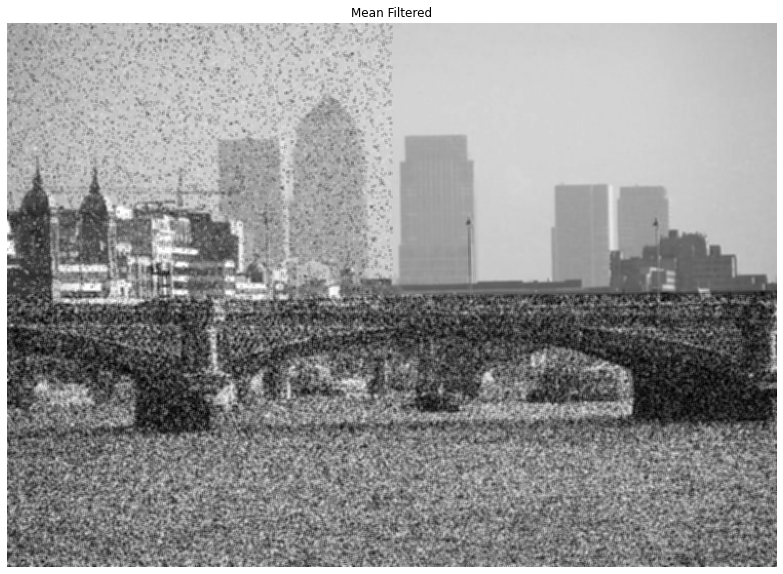

In [14]:
plt.figure(figsize=(15,10))
imshow(im_mean, "Mean Filtered")

im_mean_11 = im_mean[0:N//2-1, 0:M//2+1].copy()
im_mean_12 = im_mean[0:N//2-1, M//2+1:M].copy()
im_mean_21 = im_mean[N//2-1:N, 0:M//2+1].copy()
im_mean_22 = im_mean[N//2-1:N, M//2+1:M].copy()

snr_11_mean = snr_calculator(im_orig_11, im_mean_11)
snr_12_mean = snr_calculator(im_orig_12, im_mean_12)
snr_21_mean = snr_calculator(im_orig_21, im_mean_21)
snr_22_mean = snr_calculator(im_orig_22, im_mean_22)

print("SNR of 11,12,21,22 respectively:")
print(snr_11_mean)
print(snr_12_mean)
print(snr_21_mean)
print(snr_22_mean)

**The final comparison:**

|Filter Name|Salt/Pepper SNR|Combined SNR|Gaussian SNR|Salt/Pepper Visually|Combined Visually|Gaussian Visually|
|:---:|:---:|:---:|:---:|:---:|:---:|:---:|
|Median|24.15|9.33|10.07|Perfect|Poor|Poor|
|Gaussian|20.28|11.69|12.69|Good|OK|OK|
|Mean|19.44|10.86|11.76|Good|OK|OK|

---
### Question 2

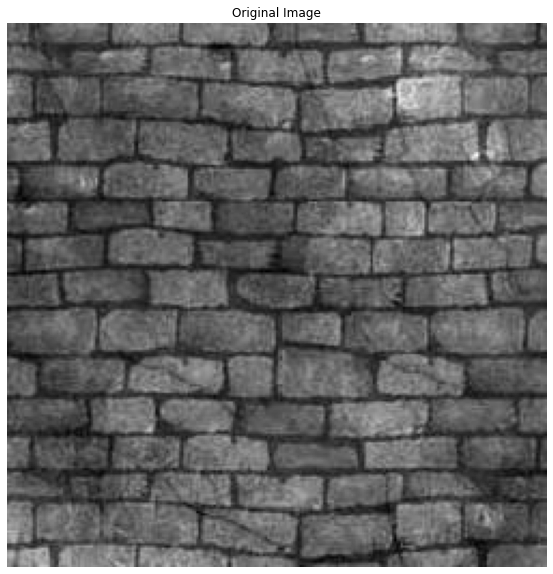

In [15]:
im = np.array(Image.open("./wall.jpg"))
plt.figure(figsize=(15,10))
imshow(im[:,:,0], "Original Image")

**a)**

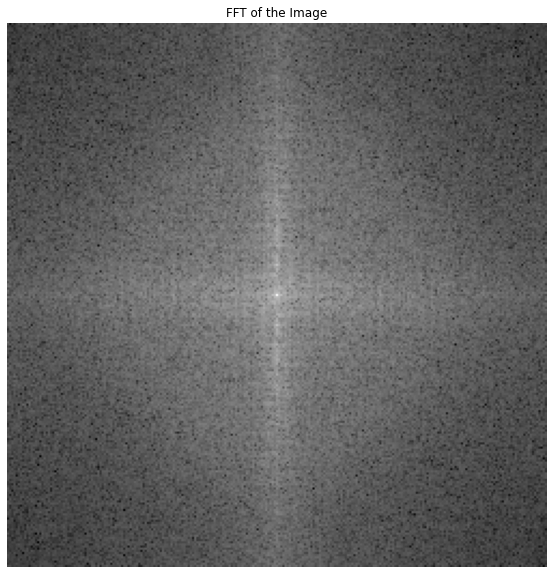

In [16]:
im_gray = im[:,:,0].astype("double")
im_fft = np.fft.fftshift(np.fft.fft2(im_gray))
plt.figure(figsize=(15,10))
imshow(10*np.log(np.abs(im_fft)), "FFT of the Image")

**b)**

In [17]:
N, M = im_fft.shape
filt = np.empty((N, M))
for i in range(N):
    for j in range(M):
        r = np.sqrt((i-N//2)**2 + (j-M//2)**2)
        if (abs(i-N//2) >= 25) or (abs(j-M//2) >= 25):
            filt[i,j] = 1e-8
        #elif (abs(j-M//2) >= M//4 - 10) and (abs(j-M//2) <= M//4 + 10):
            #filt[i,j] = 1e-8
        #if r >= (N//4 -10) and r <= (N//4 + 10):
            #filt[i,j] = 1e-8
        else:
            filt[i,j] = 1

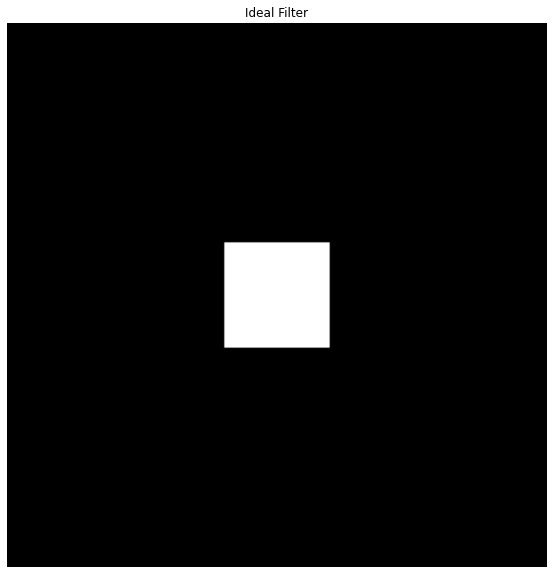

In [18]:
plt.figure(figsize=(15,10))
imshow(filt,"Ideal Filter")

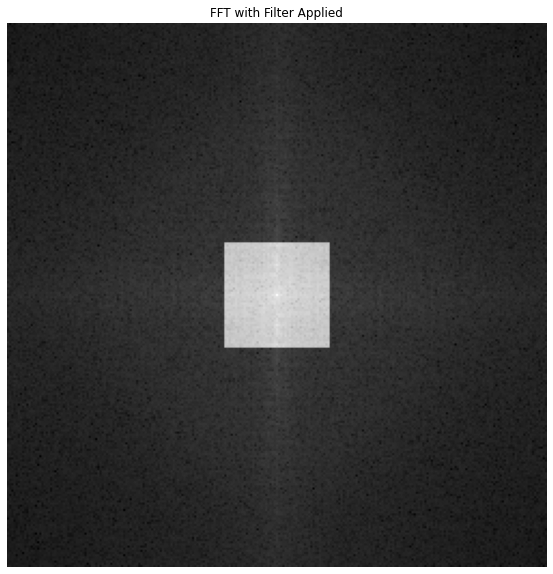

In [19]:
im_filtered_fft = im_fft * filt
plt.figure(figsize=(15,10))
imshow(10 * np.log(np.abs(im_filtered_fft)),"FFT with Filter Applied")

In [20]:
im_filtered = np.real(np.fft.ifft2(np.fft.ifftshift(im_filtered_fft)))

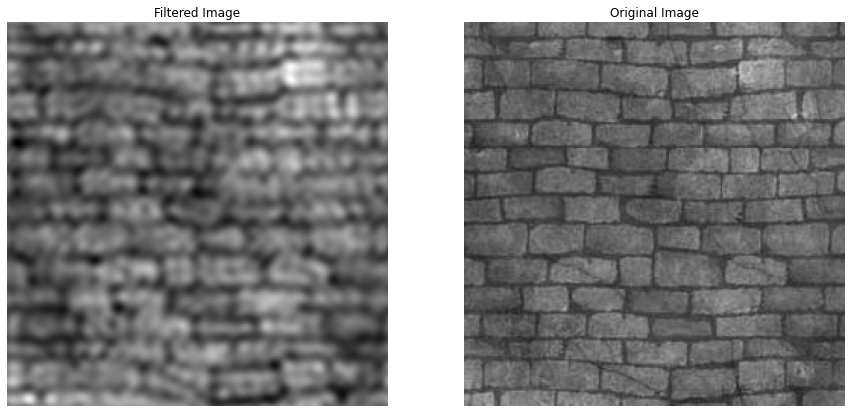

In [21]:
im_filtered = np.round_(im_filtered).astype("uint8")
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
imshow(im_filtered, "Filtered Image")
plt.subplot(1,2,2)
imshow(im, "Original Image")

**c)**

In [22]:
highpass_filt = 1 + 1e-8 - filt
highpass_filt = highpass_filt/highpass_filt.max()

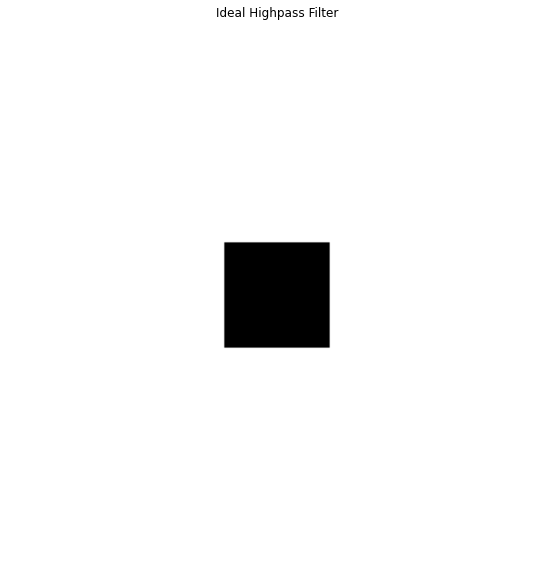

In [23]:
plt.figure(figsize=(15,10))
imshow(highpass_filt,"Ideal Highpass Filter")

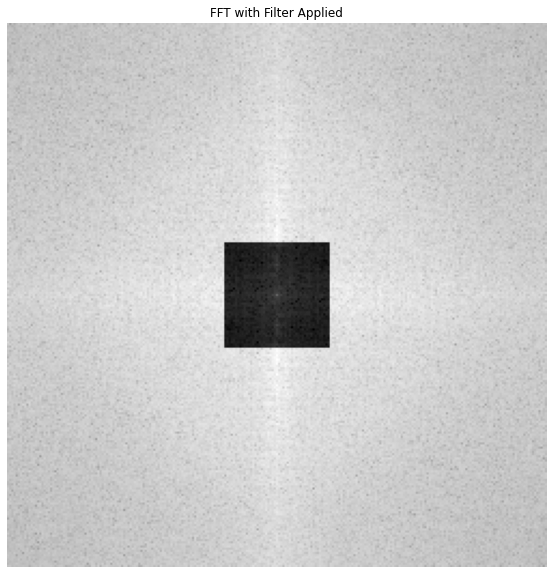

In [24]:
im_filtered_fft = im_fft * highpass_filt
plt.figure(figsize=(15,10))
imshow(10 * np.log(np.abs(im_filtered_fft)),"FFT with Filter Applied")

In [25]:
im_filtered = np.real(np.fft.ifft2(np.fft.ifftshift(im_filtered_fft)))

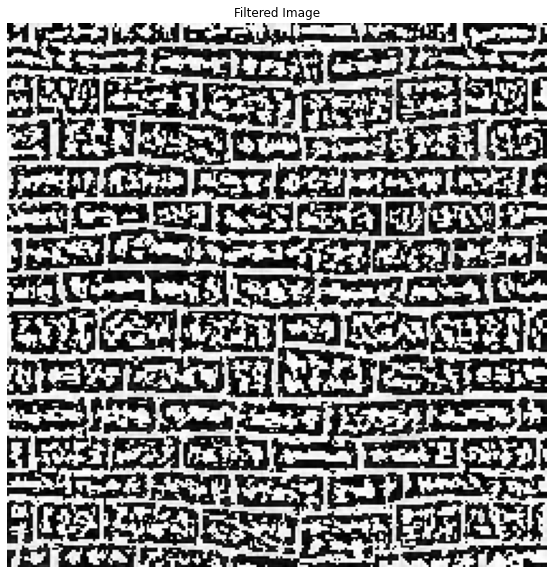

In [26]:
im_filtered = np.round_(im_filtered).astype("uint8")
plt.figure(figsize=(15,10))
imshow(im_filtered, "Filtered Image")

**d)**

In [27]:
class Filterer:
    def __init__(self, im):
        self.im = im
        self.im_fft = np.fft.fftshift(np.fft.fft2(im))
    def set_lowpass_filter(self,lp_filt):
        self.lp_filt = lp_filt
    def set_highpass_filter(self,hp_filt):
        self.hp_filt = hp_filt
    def filter_image(self, return_fft = False):
        im_lp_fft = self.im_fft * self.lp_filt
        im_hp_fft = self.im_fft * self.hp_filt
        
        im_lp = np.real(np.fft.ifft2(np.fft.ifftshift(im_lp_fft)))
        im_hp = np.real(np.fft.ifft2(np.fft.ifftshift(im_hp_fft)))
        
        if (return_fft):
            return (im_lp, im_hp, im_lp_fft, im_hp_fft)
        return (im_lp, im_hp)
        
    
class Filter_Generator:
    def generate_gaussian(self, N, M, sigma):
        x0 = N//2
        y0 = M//2
        filt = np.zeros((N,M))
        for i in range(N):
            for j in range(M):
                filt[i,j] = np.exp(-2 * np.pi**2 * sigma**2 * (((i-x0)/N)**2 + ((j-y0)/M)**2))
        return filt
    def generate_laplacian(self, N, M):
        x0 = N//2
        y0 = M//2
        filt = np.zeros((N,M))
        for i in range(N):
            for j in range(M):
                filt[i,j] = -(((i-x0)/N)**2 + ((j-y0)/M)**2)
        return filt
    def generate_butterworth(self, N, M, w0, order=2):
        x0 = N//2
        y0 = M//2
        filt = np.zeros((N,M))
        for i in range(N):
            for j in range(M):
                u = (i-x0)/N
                v = (j-y0)/M
                r = (u**2 + v**2)**0.5
                filt[i,j] = 1/np.sqrt(1 + (2 * np.pi* r/w0)**(2*order))
        return filt

In [28]:
im_filterer = Filterer(im_gray)

filter_generator = Filter_Generator()
gaussian_filter = filter_generator.generate_gaussian(N, M, 1.2)
gaussian_filter_comp = 1 - gaussian_filter

laplacian_filter = filter_generator.generate_laplacian(N,M)
laplacian_filter = laplacian_filter/(np.abs(laplacian_filter).max())
laplacian_filter_comp = 1 - laplacian_filter

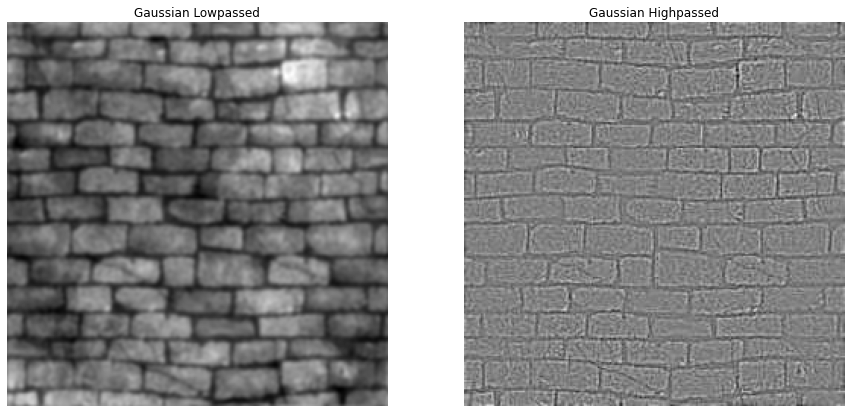

In [29]:
# Gaussian
im_filterer.set_lowpass_filter(gaussian_filter)
im_filterer.set_highpass_filter(gaussian_filter_comp)
im_gaussian_lp, im_gaussian_hp = im_filterer.filter_image()

im_gaussian_lp = (im_gaussian_lp - im_gaussian_lp.min())/(im_gaussian_lp.max() - im_gaussian_lp.min())
im_gaussian_hp = (im_gaussian_hp - im_gaussian_hp.min())/(im_gaussian_hp.max() - im_gaussian_hp.min())


plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
imshow(im_gaussian_lp, "Gaussian Lowpassed")
plt.subplot(1,2,2)
imshow(im_gaussian_hp, "Gaussian Highpassed")

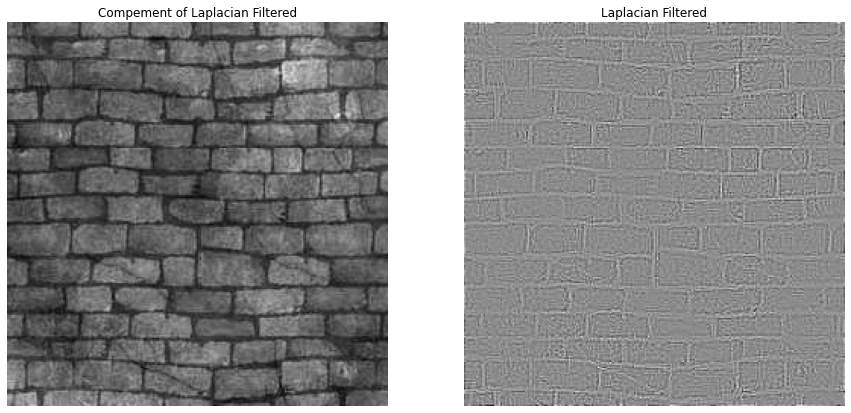

In [30]:
# Laplacian
im_filterer.set_highpass_filter(laplacian_filter)
im_filterer.set_lowpass_filter(laplacian_filter_comp)
im_laplacian_comp, im_laplacian = im_filterer.filter_image()

im_laplacian = (im_laplacian - im_laplacian.min())/(im_laplacian.max() - im_laplacian.min())
im_laplacian_comp = (im_laplacian_comp - im_laplacian_comp.min())/(im_laplacian_comp.max() - im_laplacian_comp.min())


plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
imshow(im_laplacian_comp, "Compement of Laplacian Filtered")
plt.subplot(1,2,2)
imshow(im_laplacian, "Laplacian Filtered")

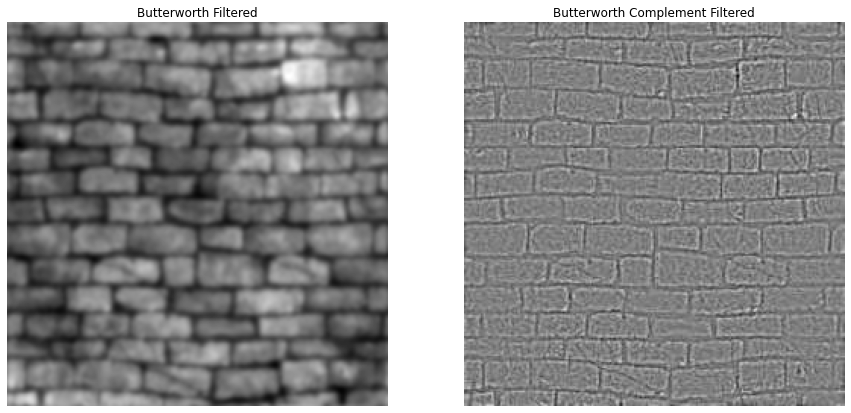

In [31]:
# Butterworth
butterworth_filter = filter_generator.generate_butterworth(N, M, w0 = 2*np.pi / 10, order=3)
butterworth_filter_comp = 1 - butterworth_filter

im_filterer.set_lowpass_filter(butterworth_filter)
im_filterer.set_highpass_filter(butterworth_filter_comp)
im_butter_lp, im_butter_hp = im_filterer.filter_image()

im_butter_lp = (im_butter_lp - im_butter_lp.min())/(im_butter_lp.max() - im_butter_lp.min())
im_butter_hp = (im_butter_hp - im_butter_hp.min())/(im_butter_hp.max() - im_butter_hp.min())


plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
imshow(im_butter_lp, "Butterworth Filtered")
plt.subplot(1,2,2)
imshow(im_butter_hp, "Butterworth Complement Filtered")

**e)**

The problem with applying an ideal filter is that by applying this type of filter, due to the fact that this filter has a square shape pattern in frequancy domain, the same pattern would appear in the image in the spatial domain as well. In addition, the spatial kernel of this filter is obtained by the multiplication of two $SinC$ functions and because SinC has many considerable peaks in points far from its center, in calculating the convolution for finding the value of a point, the points which are far from intended point would have significant effects on its value which is not desired and this would some how degrade the output image.

---
### Question 3

**a)**

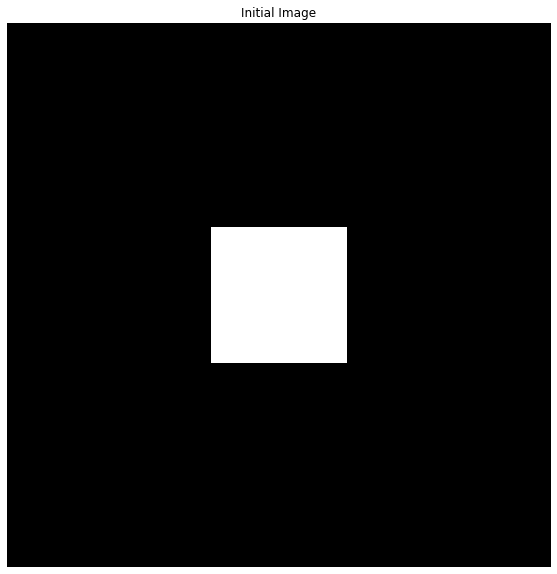

In [32]:
im1 = np.zeros((512,512))
for i in range(512//2-64, 512//2+64):
    for j in range(512//2-64, 512//2+64):
        im1[i,j] = 1
im2 = im1.copy()
plt.figure(figsize=(15,10))
imshow(im1, "Initial Image")

In [33]:
t1_start = process_time()
im_conv_1 = signal.convolve2d(im1, im2, mode="same")
t1_stop = process_time()

In [34]:
method1_time = t1_stop - t1_start
print("This Method's Process time in seconds: ", method1_time)

This Method's Process time in seconds:  133.064739


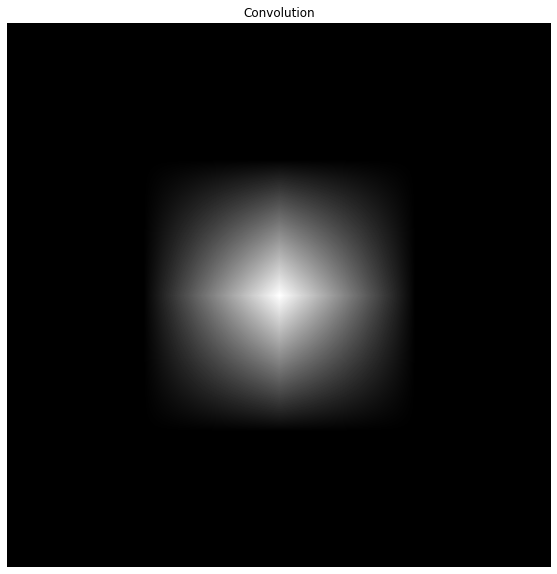

In [35]:
plt.figure(figsize=(15,10))
imshow(im_conv_1, "Convolution")

In [36]:
max_n = 150
time_list = np.empty(max_n)
for i in range(1,max_n + 1):
    x = np.random.rand(i,i)
    t_start = process_time()
    signal.convolve2d(x, x, mode="same")
    t_stop = process_time()
    time_list[i-1] = t_stop - t_start

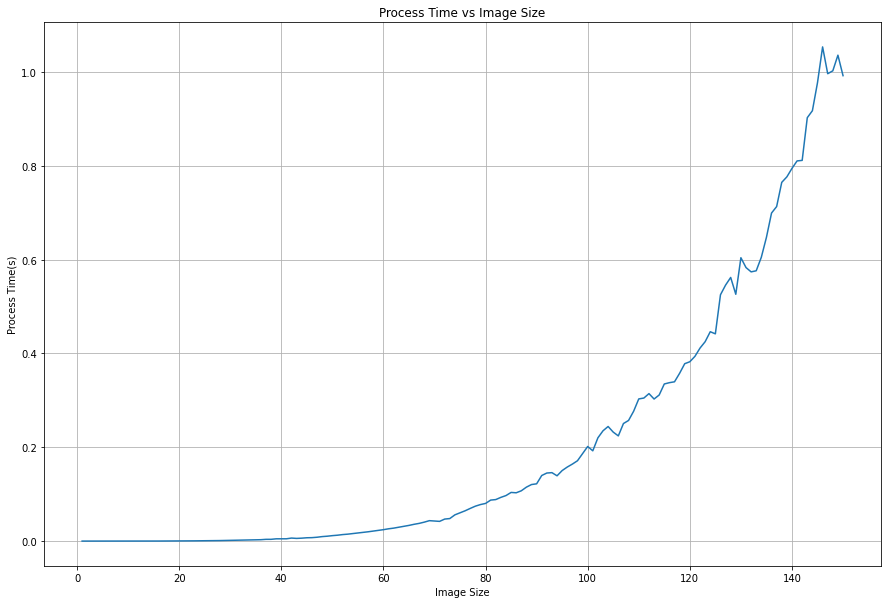

In [37]:
plt.figure(figsize=(15,10))
plt.plot(np.arange(1,max_n+1), time_list)
plt.title("Process Time vs Image Size")
plt.grid()
plt.xlabel("Image Size")
plt.ylabel("Process Time(s)")
plt.show()

**b)**

For the formula of convolution we have:
$$
y[m,n] = h[m,n] * x[m,n] = \sum_i \sum_j h[i,j]x[m-i, n-j]
$$
because we set the parameter shape="same", then both i and j would iterate on N values (size of on dimension of the square). In addition, we should calculate the equation above for all (m,n) pairs which means that we should repeat the process $N^2$ times. For each point (m,n), we would have $N^2$ multiplications (because both i and j iterate N values) and we can assume that addition takes much less time in comparison with multiplication and we can neglect it. Then, we can conclude that the order of the process is $O(N^4)$. I plotted the function $y = an^4$ below (calculating $a$ by experience) and as can be seen, it totally agrees with the results of the previous part.

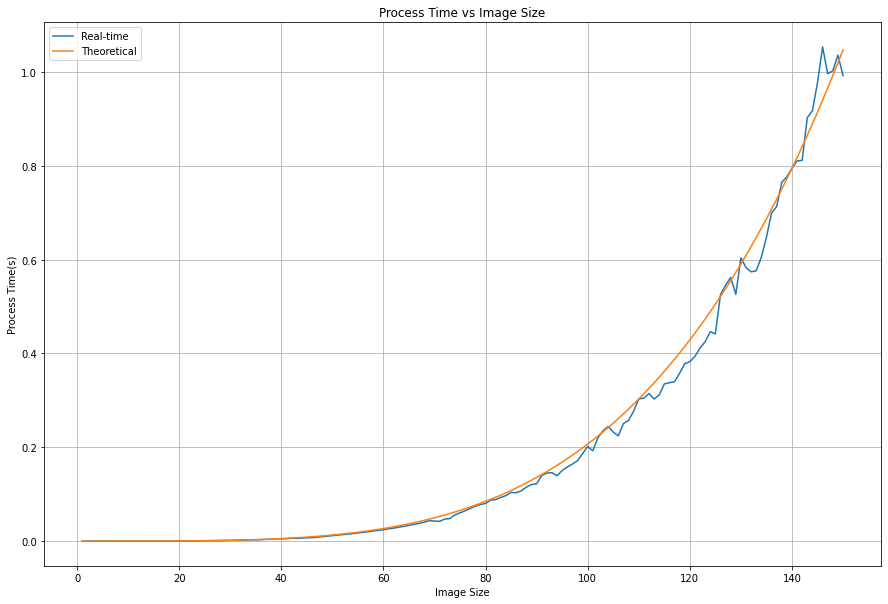

In [42]:
n = np.arange(1, max_n + 1)
a = time_list[139] / 140**4
y = a * n**4

plt.figure(figsize=(15,10))
plt.plot(n, time_list, label="Real-time")
plt.plot(n, y, label="Theoretical")
plt.title("Process Time vs Image Size")
plt.grid()
plt.xlabel("Image Size")
plt.ylabel("Process Time(s)")
plt.legend()
plt.show()

**c)**

In [43]:
def convolve(im1, im2):
    '''This function finds the convolution of two images with the same size.'''
    n, m = im1.shape 
    im1_padded = np.pad(im1,((0,n-1),(0,m-1)), mode = "constant")
    im2_padded = np.pad(im2,((0,n-1),(0,m-1)), mode = "constant")
    
    im1_fft = np.fft.fftshift(np.fft.fft2(im1_padded))
    im2_fft = np.fft.fftshift(np.fft.fft2(im2_padded))
    
    im_conv_fft = im1_fft * im2_fft
    im_conv = np.real(np.fft.ifft2(np.fft.fftshift(im_conv_fft)))
    
    im_conv = im_conv[(n//2 - 1):(n//2 + n - 1), (m//2 - 1):(m//2 + m - 1)]
    return im_conv

In [44]:
t2_start = process_time()
im_conv_2 = convolve(im1,im2)
t2_stop = process_time()

In [45]:
method2_time = t2_stop - t2_start
print("This Method's Process time in seconds: ", method2_time)

This Method's Process time in seconds:  0.1685200000000009


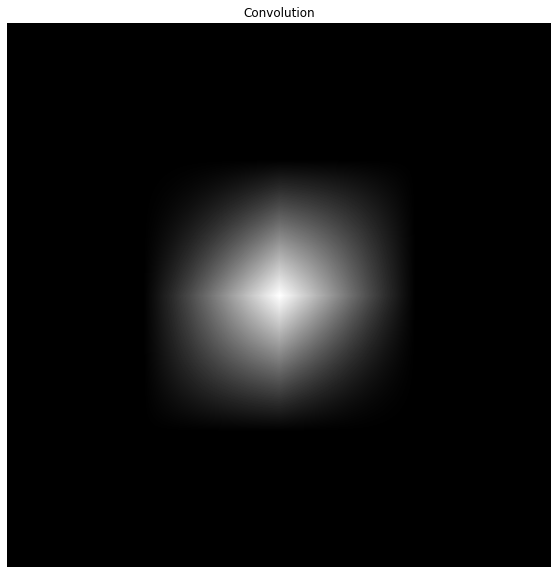

In [46]:
plt.figure(figsize=(15,10))
imshow(im_conv_2, "Convolution")

In [47]:
max_n = 150
time_list_2 = np.empty(max_n)
for i in range(1,max_n + 1):
    x = np.random.rand(i,i)
    t_start = process_time()
    convolve(x, x)
    t_stop = process_time()
    time_list_2[i-1] = t_stop - t_start

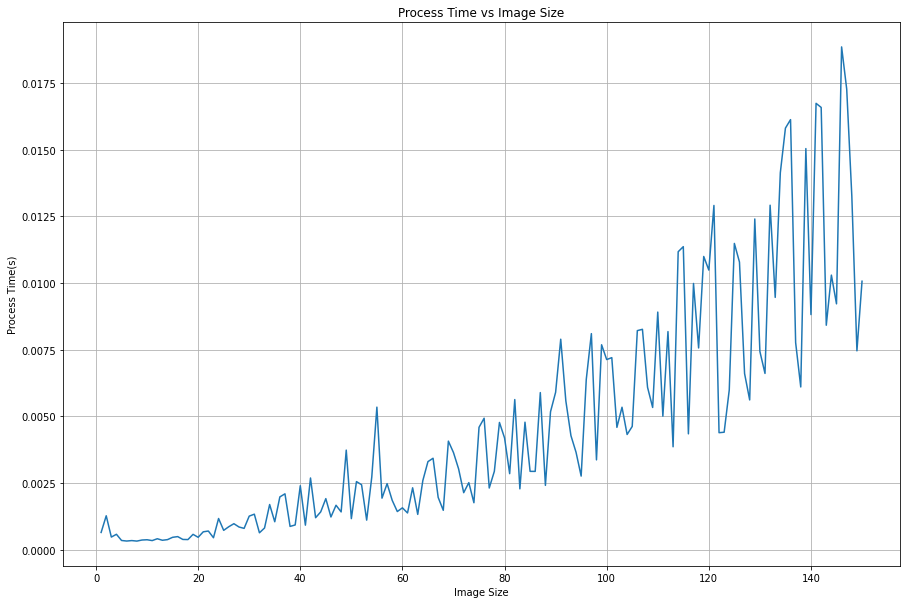

In [48]:
plt.figure(figsize=(15,10))
plt.plot(np.arange(1,max_n+1), time_list_2)
plt.title("Process Time vs Image Size")
plt.grid()
plt.xlabel("Image Size")
plt.ylabel("Process Time(s)")
plt.show()

As can be seen, the performance of the method which uses FFT is considerably better than the classical method of convolving the arrays with each other and for example for n around 150, in the worst case it is about 40 times faster than simply convolving the signals. It also worths mentioning that the reason behind the fluctuations in the process time of using FFT is that FFT itself, uses some algorithms such as cooley tukey fft algorithm that basiclly divides a N-point fft in to some fft's with less points. And due to this, for signals with a length of $N = 2^k$, the order of calculations would be around $Nlog_2N$. This method could be generalized to dividing a N-point DFT into some DFTs where the number of their points is equal to N's prime divisors. This is the main reason behind this fluctuations in the process time because some numbers have less and some have more divisors and this means that those with lower divisors can be processed really faster that the others.

---

### Question 4

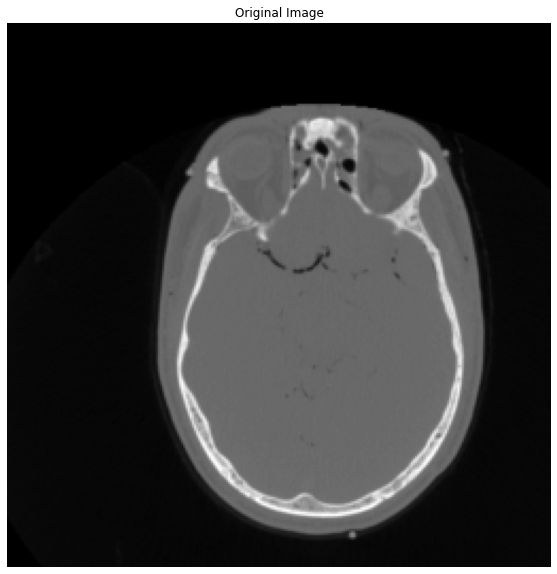

In [49]:
img = np.array(Image.open("ct.jpg"))[:,:,0]
plt.figure(figsize=(15,10))
imshow(img,"Original Image")

In [50]:
def spatial_shift(im, x_shift, y_shift):
    im_fft = np.fft.fft2(im)
    shifter_fft = np.zeros(im.shape, dtype="complex")
    N, M = im_fft.shape
    for i in range(N):
        for j in range(M):
            shifter_fft[i,j] = np.exp(-1j * 2 * np.pi * i * x_shift/N) * np.exp(-1j * 2 * np.pi * j * y_shift/M)
    shifted = np.real(np.fft.ifft2(im_fft * shifter_fft))
    return (shifted, shifter_fft)

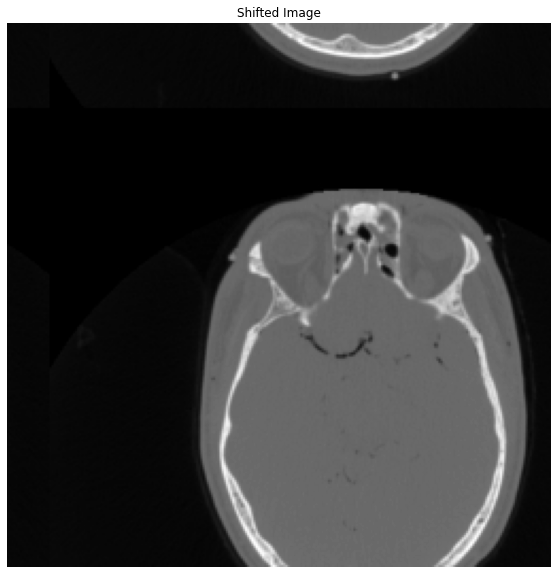

In [51]:
img_shifted, shifter_fft = spatial_shift(img, 40, 20)
plt.figure(figsize=(15,10))
imshow(img_shifted, "Shifted Image")

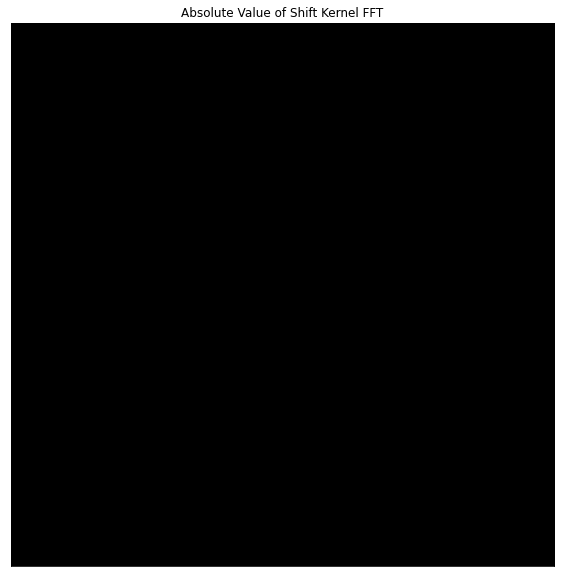

In [52]:
shifter_fft = np.round_(np.abs(shifter_fft)*255).astype("uint8")
plt.figure(figsize=(15,10))
plt.imshow(shifter_fft,cmap="gray")
plt.xticks([])
plt.yticks([])
plt.title("Absolute Value of Shift Kernel FFT")
plt.show()

As we can see, the absolute value of the given Shift Kernel FFT is constant (exactly equal to 1 when there is no quantization error), because shifting the signal in spatial domain will only change the phase of the fourier transform and not its absolute value.

---

### Question 5

In [53]:
# img is already opened from the previous question
N, M = img.shape
img_fft = np.fft.fftshift(np.fft.fft2(img))
img_fft_padded = np.pad(img_fft, ((3*N//2,3*N//2), (3*M//2,3*M//2)), mode="constant", constant_values=0)
img_zoomed_in = np.abs(np.fft.ifft2(img_fft_padded))
img_zoomed_in = (img_zoomed_in - img_zoomed_in.min())/(img_zoomed_in.max() - img_zoomed_in.min()) * 255
img_zoomed_in = np.round_(img_zoomed_in).astype("uint8")
print("Size of the Original Image:", img.shape)
print("Size of the Zoomed-In Image:", img_zoomed_in.shape)

Size of the Original Image: (256, 256)
Size of the Zoomed-In Image: (1024, 1024)


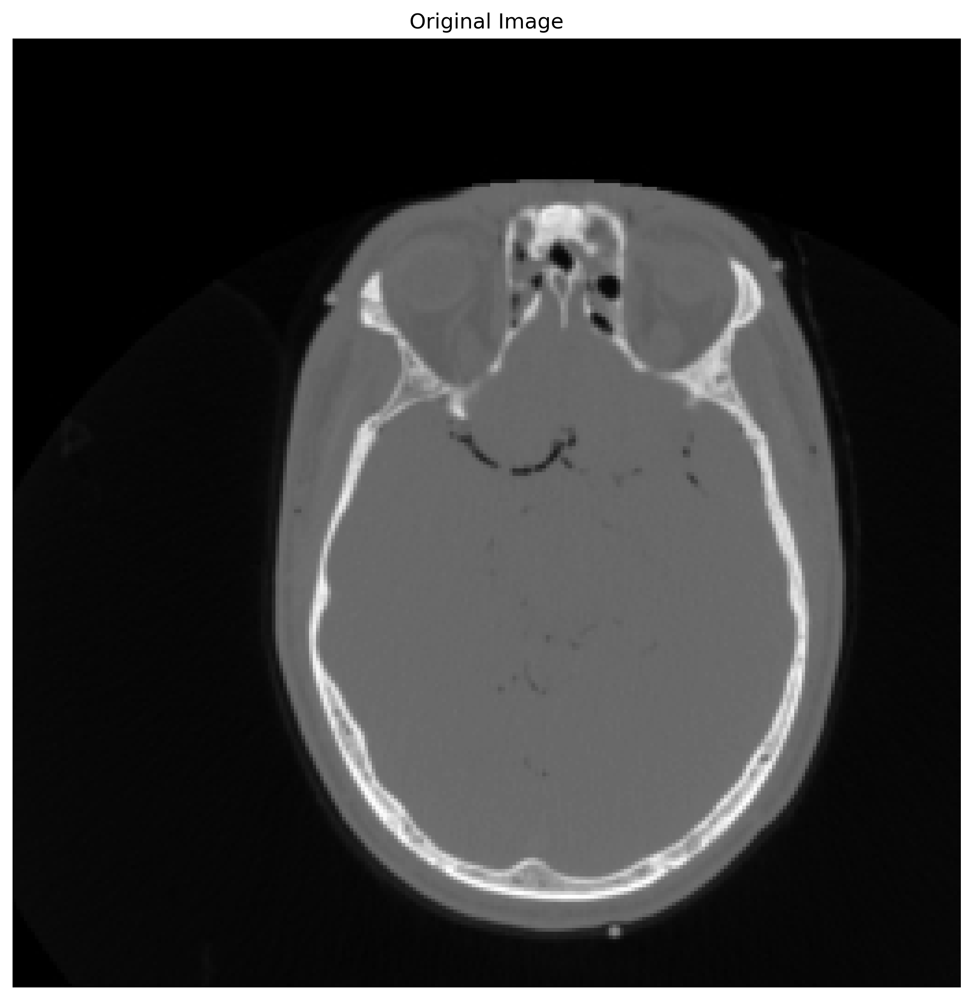

In [56]:
plt.figure(figsize=(15,10))
plt.rcParams["figure.dpi"] = 300
imshow(img, "Original Image")

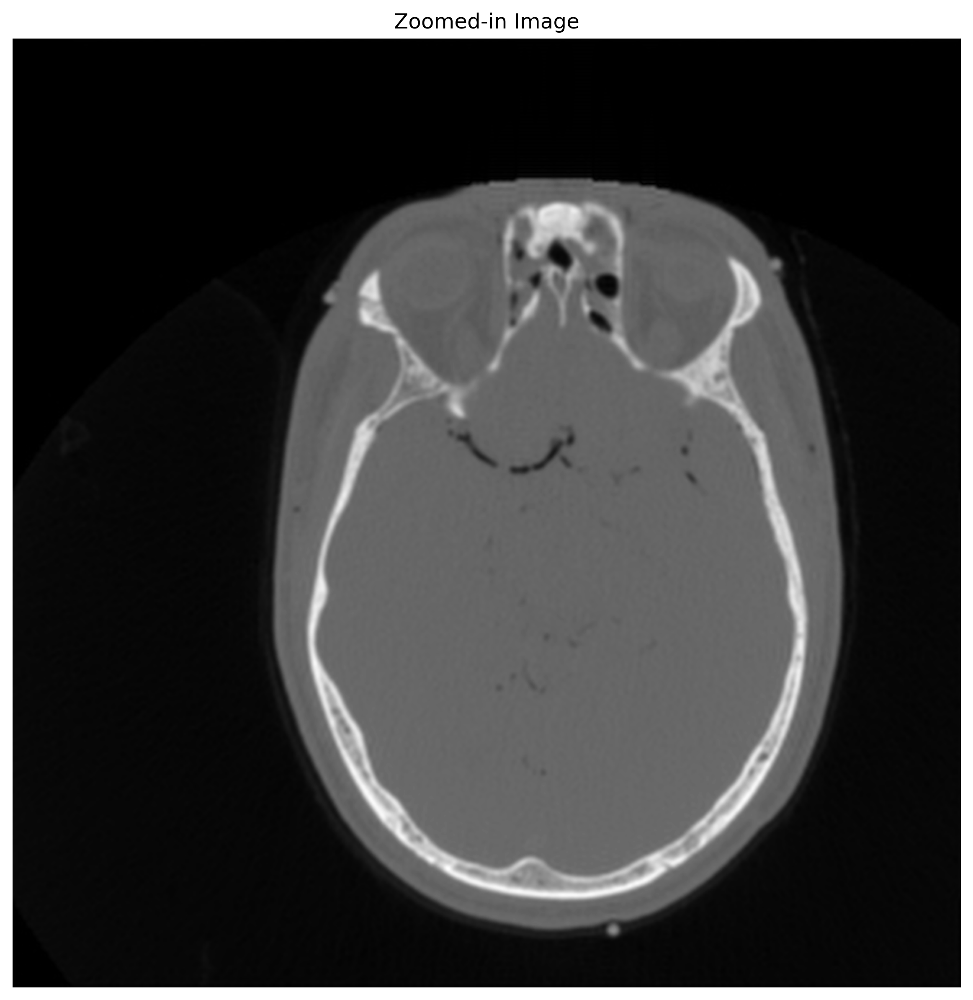

In [57]:
plt.figure(figsize=(15,10))
plt.rcParams["figure.dpi"] = 300
imshow(img_zoomed_in,"Zoomed-in Image")

As can be seen, the zoomed-in version is actually an interpolated upsampled version of the original image which has a better resolution in comparison we the original image.

---

### Question 6

In [58]:
im_hand = np.array(Image.open("hand_xray.jpg"))
im_brain = np.array(Image.open("brain_xray.jpg"))

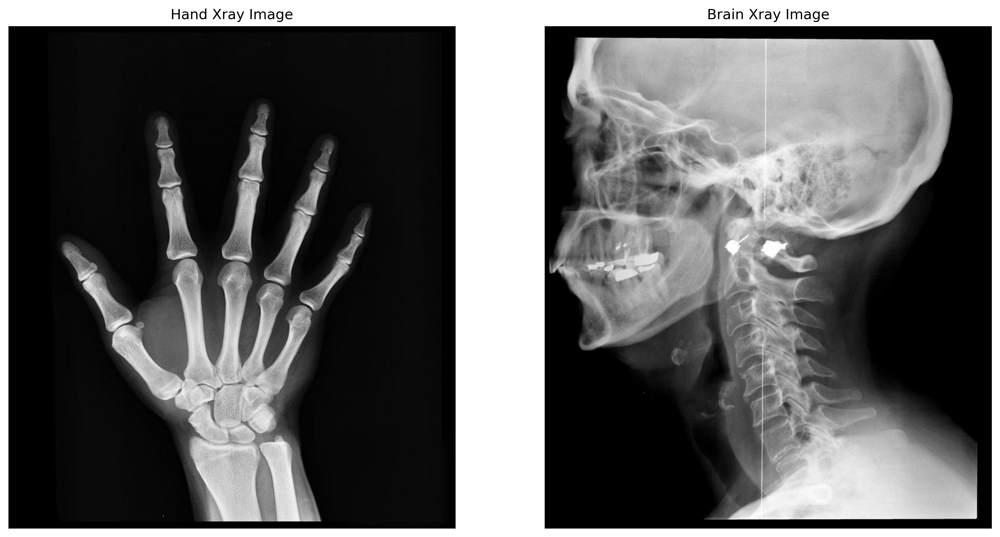

In [59]:
plt.figure(figsize=(15,10))
plt.rcParams["figure.dpi"] = 130
plt.subplot(1,2,1)
imshow(im_hand, "Hand Xray Image")
plt.subplot(1,2,2)
imshow(im_brain, "Brain Xray Image")

In [60]:
im_hand_fft = np.fft.fft2(im_hand)
im_brain_fft = np.fft.fft2(im_brain)

im_hand_phase = np.angle(im_hand_fft)
im_hand_abs = np.abs(im_hand_fft)

im_brain_phase = np.angle(im_brain_fft)
im_brain_abs = np.abs(im_brain_fft)

im_new1_fft = im_hand_abs * np.exp(1j * im_brain_phase)
im_new2_fft = im_brain_abs * np.exp(1j * im_hand_phase)

im_new1 = np.abs(np.fft.ifft2(im_new1_fft))
im_new2 = np.abs(np.fft.ifft2(im_new2_fft))

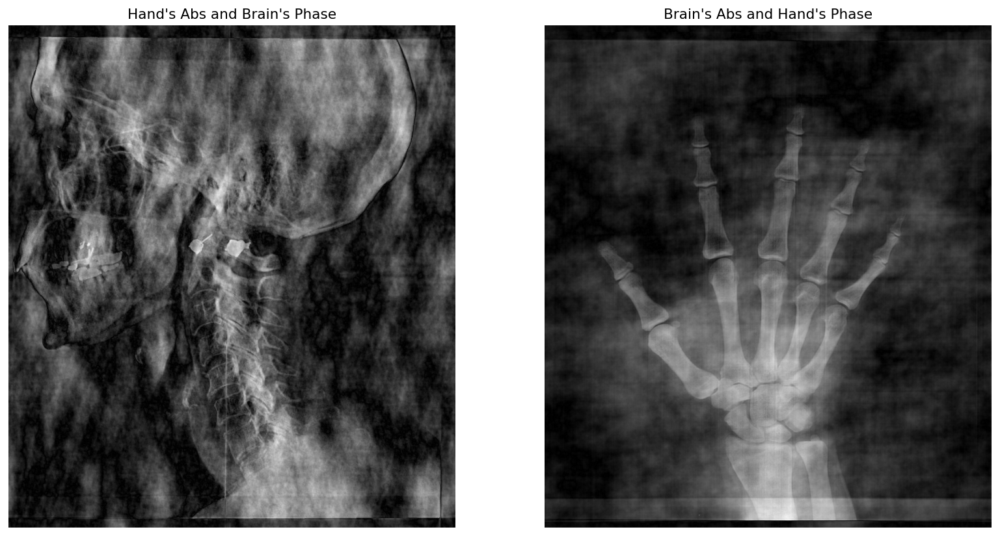

In [61]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
imshow(im_new1, "Hand's Abs and Brain's Phase")
plt.subplot(1,2,2)
imshow(im_new2, "Brain's Abs and Hand's Phase")

The results show that in each combination, the output is more similar to the image whose phase has been used in the construction of the image. This means that most of the information of an image is stored inside its phase.